In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import matplotlib as mpl
import seaborn as sns
import h5py
import time
import scipy.sparse as sp
import yaml
import gc
from matplotlib import gridspec

from datetime import datetime

import anndata as an
import scanpy as sc

sc.settings.verbosity = 3

In [2]:
%%time
fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/sample_1_adata_cell_type_deg.parquet"

df = pd.read_parquet(fpath)
print(f"Raw data shape: {df.shape=}")
df = df.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])

df.head()

Raw data shape: df.shape=(6103188, 8)
CPU times: user 5.92 s, sys: 1.77 s, total: 7.69 s
Wall time: 7.77 s


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
5516,B-2 B cell,IGKV2OR2-10,0.058087,9.903637,0.953679,0.999987,0.001127,8.977733e-07
5520,B-2 B cell,IGHV3-47,0.057810,8.766234,0.953900,0.999987,0.001127,6.284413e-06
5034,B-2 B cell,IGKV2-40,0.173477,8.730827,0.862276,0.999987,0.003382,1.795547e-05
3613,B-2 B cell,IGLV1-50,0.983110,7.728125,0.325553,0.999987,0.019166,1.005506e-04
5045,B-2 B cell,IGKV1D-37,0.172185,7.695893,0.863292,0.999987,0.003382,4.309312e-05


In [3]:
df['group'].value_counts()

group
vein endothelial cell                                          52164
B-2 B cell                                                     52164
CD16-negative, CD56-bright natural killer cell, human          52164
CD16-positive, CD56-dim natural killer cell, human             52164
CD1c-positive myeloid dendritic cell                           52164
                                                               ...  
CD8-alpha-alpha-positive, alpha-beta intraepithelial T cell    52164
CD8-positive, alpha-beta cytotoxic T cell                      52164
CD8-positive, alpha-beta memory T cell                         52164
IgA plasma cell                                                52164
NKp44-negative group 3 innate lymphoid cell, human             52164
Name: count, Length: 117, dtype: int64

In [4]:
cell_type_compartments = {
    "lymphoid": [
        'B-2 B cell', 'class switched memory B cell', 'follicular B cell',
        'memory B cell', 'naive B cell', 'plasma cell', 'plasmablast',
        'precursor B cell', 'pro-B cell', 'transitional stage B cell',
        'tonsil germinal center B cell',
        'CD4-positive helper T cell', 'CD4-positive, alpha-beta cytotoxic T cell',
        'CD4-positive, alpha-beta memory T cell', 'CD4-positive, alpha-beta thymocyte',
        'CD8-alpha-alpha-positive, alpha-beta intraepithelial T cell',
        'CD8-positive, alpha-beta cytotoxic T cell',
        'CD8-positive, alpha-beta memory T cell',
        'central memory CD4-positive, alpha-beta T cell',
        'central memory CD8-positive, alpha-beta T cell',
        'effector CD4-positive, alpha-beta T cell',
        'effector CD8-positive, alpha-beta T cell',
        'effector memory CD4-positive, alpha-beta T cell',
        'effector memory CD8-positive, alpha-beta T cell',
        'activated CD4-positive, alpha-beta T cell',
        'activated CD8-positive, alpha-beta T cell',
        'naive thymus-derived CD4-positive, alpha-beta T cell',
        'naive thymus-derived CD8-positive, alpha-beta T cell',
        'alpha-beta T cell', 'gamma-delta T cell', 'mucosal invariant T cell',
        'double-positive, alpha-beta thymocyte', 'double negative thymocyte',
        'thymocyte', 'T follicular helper cell',
        'NKp44-negative group 3 innate lymphoid cell, human',
        'NKp44-positive group 3 innate lymphoid cell, human',
        'group 2 innate lymphoid cell', 'group 3 innate lymphoid cell',
        'group 3 innate lymphoid cell, human',
        'immature innate lymphoid cell', 'decidual natural killer cell, human',
        'CD16-negative, CD56-bright natural killer cell, human',
        'CD16-positive, CD56-dim natural killer cell, human',
        'lymphocyte'
    ],
    "myeloid": [
        'classical monocyte', 'non-classical monocyte', 'myelocyte',
        'neutrophil', 'inflammatory macrophage', 'alveolar macrophage',
        'central nervous system macrophage',
        'conventional dendritic cell', 'plasmacytoid dendritic cell',
        'CD1c-positive myeloid dendritic cell', 'common dendritic progenitor',
        'mast cell', 'myeloid cell'
    ],
    "progenitor": [
        'hematopoietic stem cell', 'cord blood hematopoietic stem cell',
        'hematopoietic multipotent progenitor cell',
        'hematopoietic precursor cell', 'common myeloid progenitor',
        'erythroid progenitor cell', 'megakaryocyte-erythroid progenitor cell',
        'megakaryocyte progenitor cell', 'lymphoid lineage restricted progenitor cell',
        'early lymphoid progenitor', 'fibro/adipogenic progenitor cell',
        'common dendritic progenitor', 'hematopoietic cell',
    ],
    "erythroid/megakaryocyte": [
        'erythroblast', 'erythrocyte', 'primitive red blood cell',
        'megakaryocyte', 'platelet'
    ],
    "endothelial": [
        'endothelial cell', 'capillary endothelial cell', 'gut endothelial cell',
        'blood vessel endothelial cell', 'brain vascular cell', 'cerebral cortex endothelial cell',
        'cardiac endothelial cell', 'pulmonary artery endothelial cell',
        'vein endothelial cell', 'endothelial cell of artery',
        'endothelial cell of lymphatic vessel',
        'endothelial cell of pericentral hepatic sinusoid',
        'endothelial cell of placenta', 'endothelial cell of uterus',
        'endothelial cell of vascular tree', 'endothelial cell of venule',
        'endothelial tip cell'
    ],
    "fibroblast/mesenchymal": [
        'fibroblast', 'fibroblast of lung', 'fibroblast of cardiac tissue',
        'fibroblast of mammary gland', 'skin fibroblast',
        'bronchus fibroblast of lung', 'pulmonary interstitial fibroblast',
        'skeletal muscle fibroblast', 'embryonic fibroblast',
        'alveolar type 1 fibroblast cell', 'alveolar type 2 fibroblast cell',
        'myofibroblast cell', 'mesenchymal cell', 'mesenchymal stem cell'
    ],
    "stromal/vascular support": [
        'mural cell', 'pericyte', 'lung pericyte', 'kidney interstitial fibroblast',
        'hepatic stellate cell', 'vascular associated smooth muscle cell',
        'smooth muscle cell of the pulmonary artery', 'mesothelial cell',
        'adipocyte'
    ],
}

In [5]:
# load tf list
fpath = "../../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
print(f"{len(tf_list)=}")
tf_list[:10]

len(tf_list)=1892


['ZNF354C',
 'KLF12',
 'ZNF143',
 'ZIC2',
 'ZNF274',
 'SP2',
 'ZBTB7A',
 'BCL6B',
 'ZBTB49',
 'ZIC1']

lymphoid cells
	45 cell types
	88 genes
	n_cell_types * n_genes = 3960 (np.sqrt(n_cell_types * n_genes )=62.928530890209096)


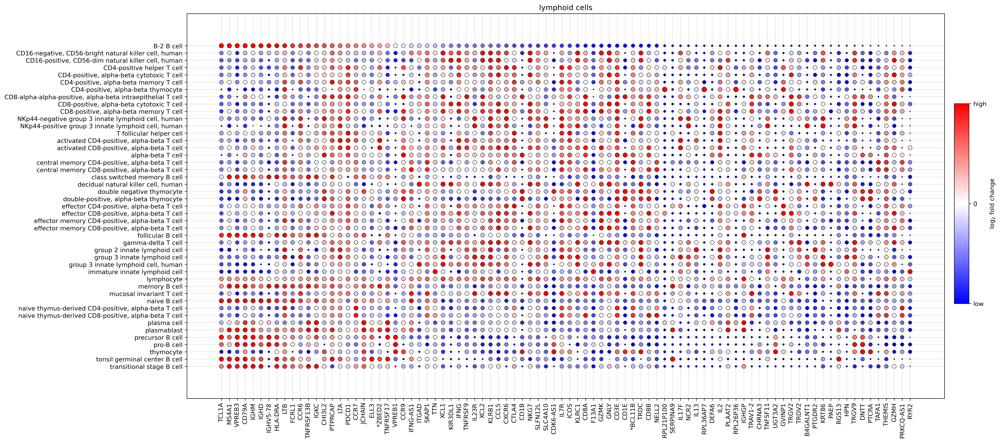

myeloid cells
	13 cell types
	36 genes
	n_cell_types * n_genes = 468 (np.sqrt(n_cell_types * n_genes )=21.633307652783937)


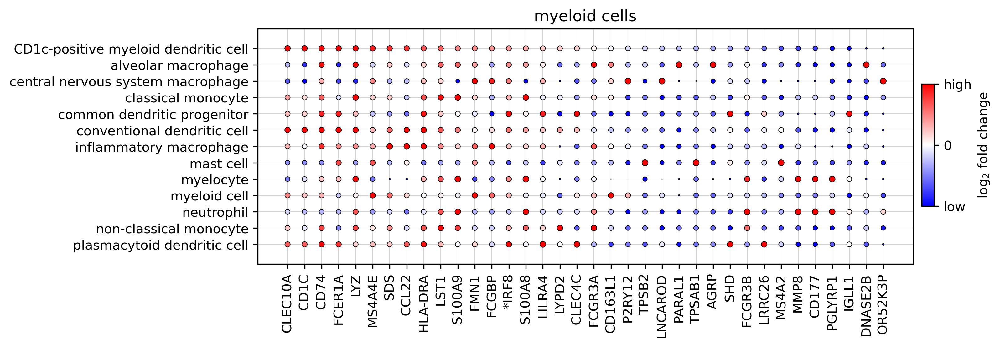

progenitor cells
	13 cell types
	32 genes
	n_cell_types * n_genes = 416 (np.sqrt(n_cell_types * n_genes )=20.396078054371138)


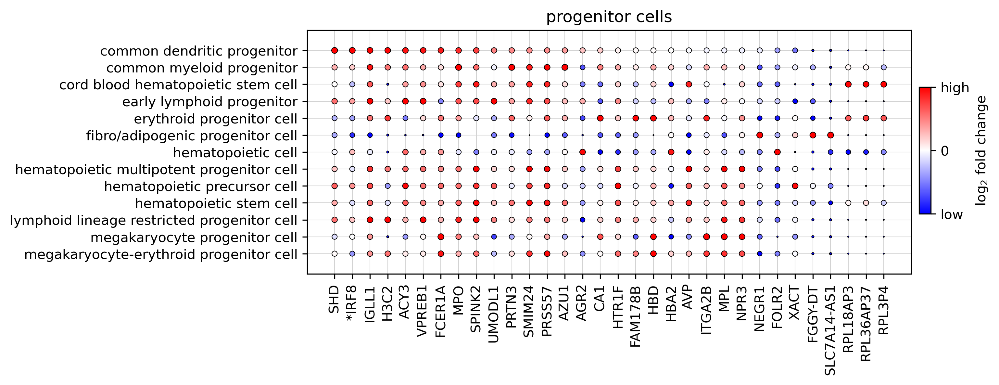

erythroid/megakaryocyte cells
	5 cell types
	12 genes
	n_cell_types * n_genes = 60 (np.sqrt(n_cell_types * n_genes )=7.745966692414834)


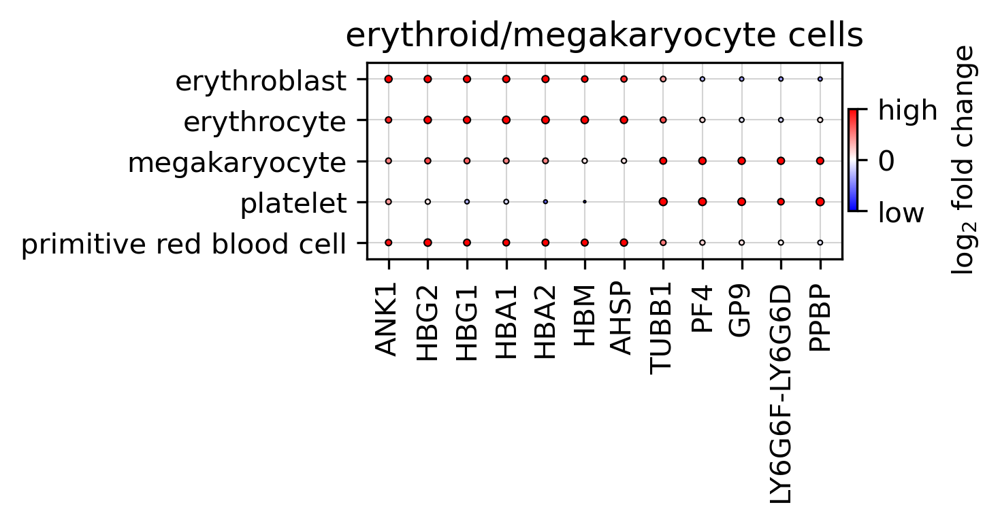

endothelial cells
	17 cell types
	48 genes
	n_cell_types * n_genes = 816 (np.sqrt(n_cell_types * n_genes )=28.5657137141714)


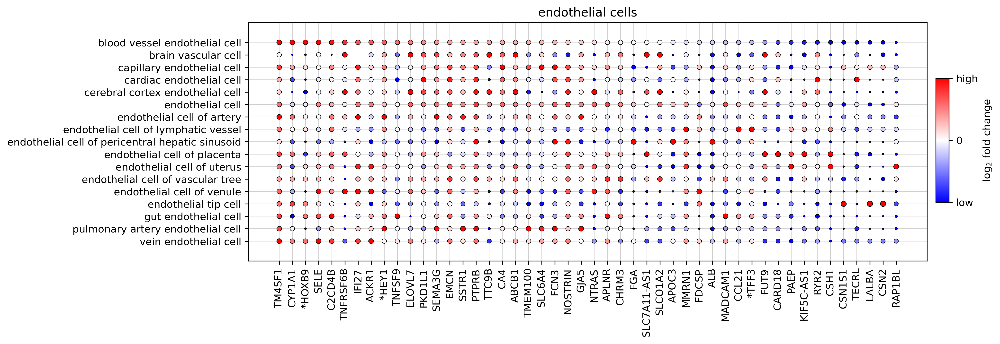

fibroblast/mesenchymal cells
	14 cell types
	41 genes
	n_cell_types * n_genes = 574 (np.sqrt(n_cell_types * n_genes )=23.958297101421877)


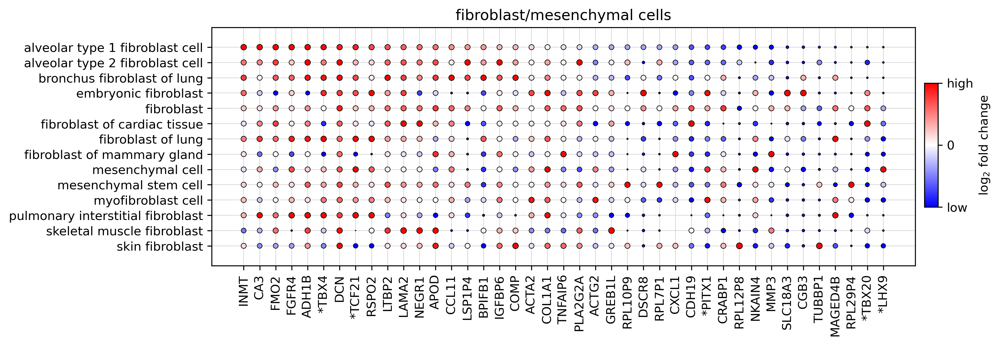

stromal/vascular support cells
	9 cell types
	25 genes
	n_cell_types * n_genes = 225 (np.sqrt(n_cell_types * n_genes )=15.0)


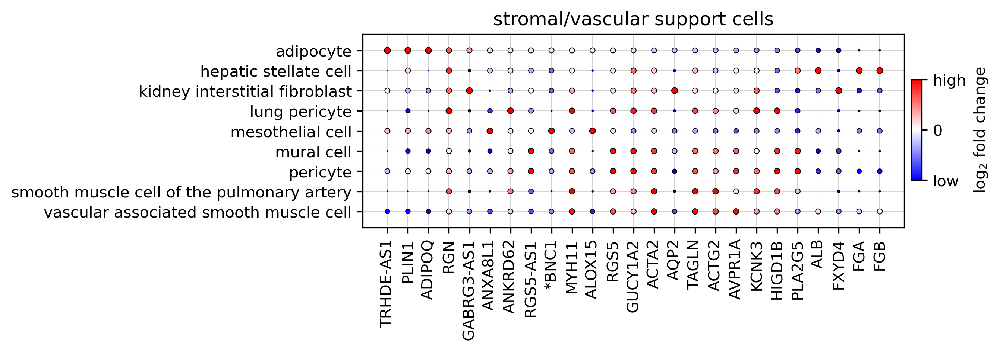

In [6]:
# params
top_n_genes = 3
pct_nz_group = 0.15
pvals_adj = 0.05
logfoldchanges = 1.0

for label, cell_list in cell_type_compartments.items():
    print(f"{label} cells")
    n_cell_types = len(cell_list)
    print(f"\t{n_cell_types} cell types")

    # extract the list of genes for the cell types
    gdf = df.copy()
    gdf = gdf[gdf['group'].isin(cell_list)]
    gdf = gdf[gdf['pct_nz_group'] > pct_nz_group].copy()
    gdf = gdf[gdf['pvals_adj'] < pvals_adj].copy()
    gdf = gdf[gdf['logfoldchanges'] > logfoldchanges].copy()

    # drop certain classes of genes
    gdf = gdf[~gdf['names'].str.contains("ENSG")].copy()
    gdf = gdf[~gdf['names'].str.startswith("LINC")].copy()
    gdf = gdf[~gdf['names'].str.startswith("MT")].copy()
    gdf = gdf[~gdf['names'].str.startswith("RPS")].copy()

    gdf = gdf.groupby('group').head(top_n_genes)

    deg_genes = gdf['names'].unique()
    n_genes = len(deg_genes)
    print(f"\t{n_genes} genes")

    # now filter the full frame for these genes
    pdf = df[df['names'].isin(deg_genes)].copy()
    pdf = pdf[pdf['group'].isin(cell_list)]

    # annotate TFs
    pdf['names'] = pdf['names'].apply(lambda x: f"*{x}" if x in tf_list else x)
    
    pdf['label'] = pdf['group'].apply(lambda x: x.replace("_", " "))
    pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])
    
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = (n_genes * 0.25), (n_cell_types * 0.25)

    print(f"\t{n_cell_types * n_genes = } ({np.sqrt(n_cell_types * n_genes )=})")
    
    sns.scatterplot(
        data=pdf,
        x='names',
        y='label',
        hue='logfoldchanges',
        size='logfoldchanges',
        sizes=(0, np.sqrt(n_cell_types * n_genes )),
        ec='k',
        lw=0.5,
        palette='bwr',
        legend=False,
        zorder=3,
        hue_norm=(-5, 5),
    )

    plt.margins(y=0.1)
    plt.title(f"{label} cells")
    plt.gca().tick_params(axis='x', rotation=90)
    plt.grid(True, zorder=0, c='lightgrey', lw=0.5)
    plt.ylabel("")
    plt.xlabel("")
    
    ax = plt.gca()
    y_labels = ax.get_yticklabels()
    y_ticks = ax.get_yticks()

    # Add standalone colorbar to the right
    fig = plt.gcf()
    cmap = plt.get_cmap('bwr')
    norm = mpl.colors.Normalize(vmin=-5, vmax=5)
    
    # [left, bottom, width, height] — adjust as needed
    cbar_ax = fig.add_axes([0.91, 0.3, 0.015, 0.4])
    
    cb = mpl.colorbar.ColorbarBase(
        cbar_ax,
        cmap=cmap,
        norm=norm,
        orientation='vertical'
    )
    
    cb.set_label('log$_2$ fold change', fontsize=10)
    cb.set_ticks([-5, 0, 5])
    cb.set_ticklabels(['low', '0', 'high'])
    
    plt.show()
    # break

lymphoid cells
	45 cell types
	39 genes
	n_cell_types * n_genes = 1755 (np.sqrt(n_cell_types * n_genes )=41.892720131306824)


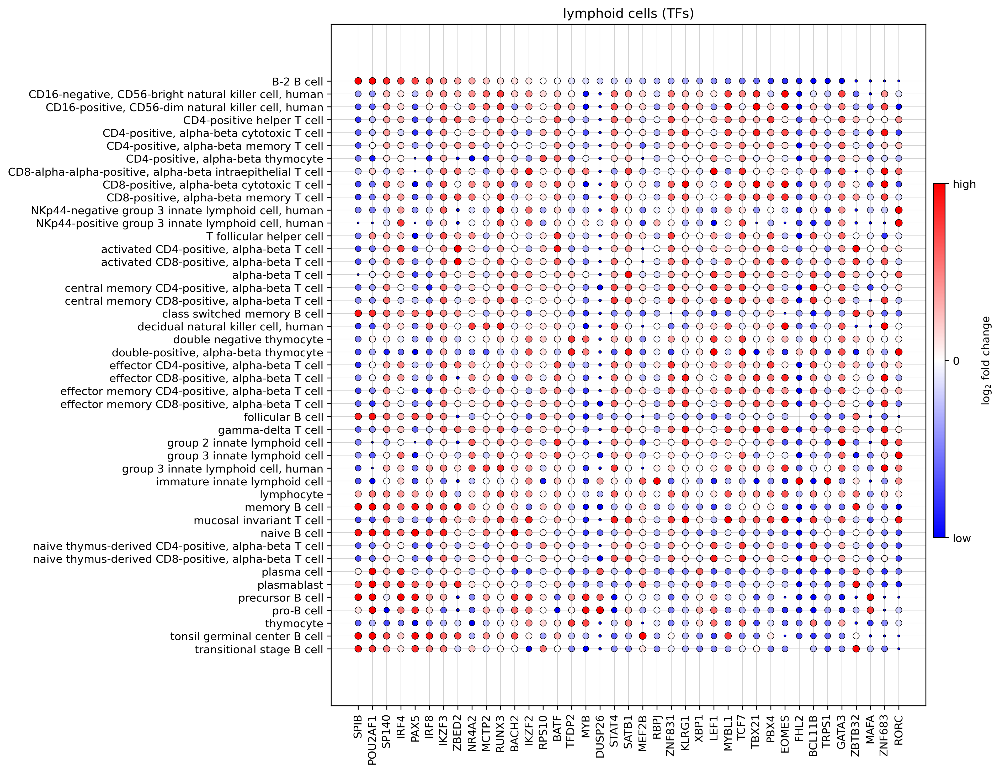

myeloid cells
	13 cell types
	27 genes
	n_cell_types * n_genes = 351 (np.sqrt(n_cell_types * n_genes )=18.734993995195193)


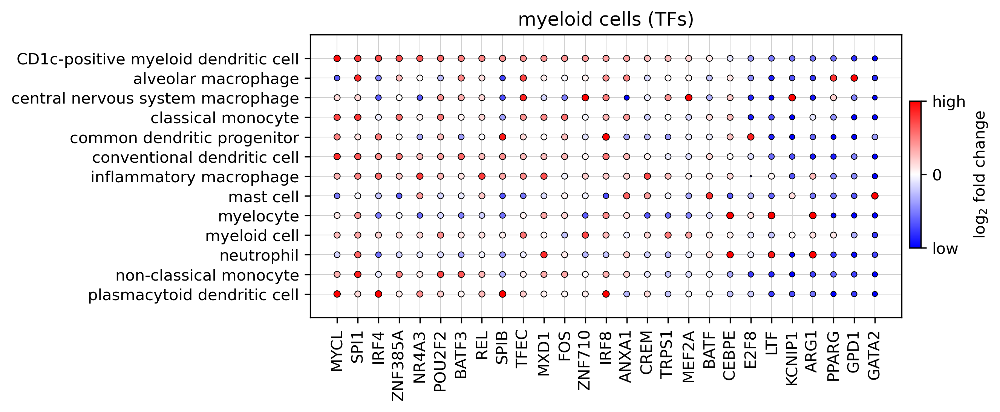

progenitor cells
	13 cell types
	26 genes
	n_cell_types * n_genes = 338 (np.sqrt(n_cell_types * n_genes )=18.384776310850235)


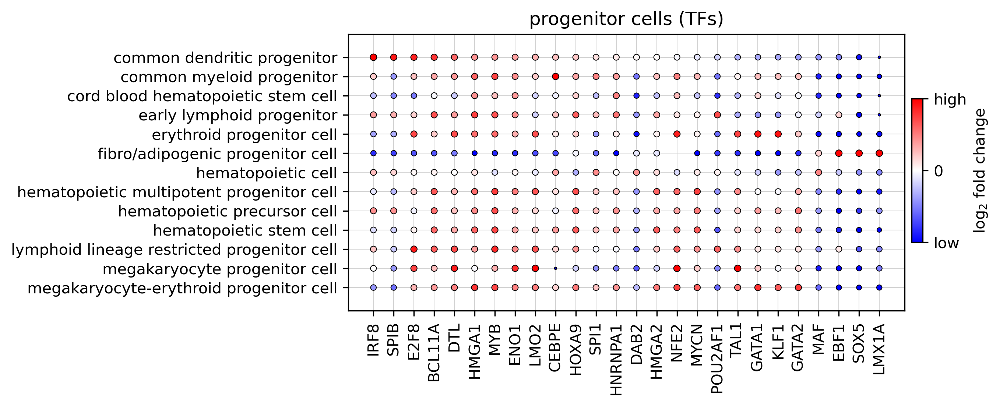

erythroid/megakaryocyte cells
	5 cell types
	8 genes
	n_cell_types * n_genes = 40 (np.sqrt(n_cell_types * n_genes )=6.324555320336759)


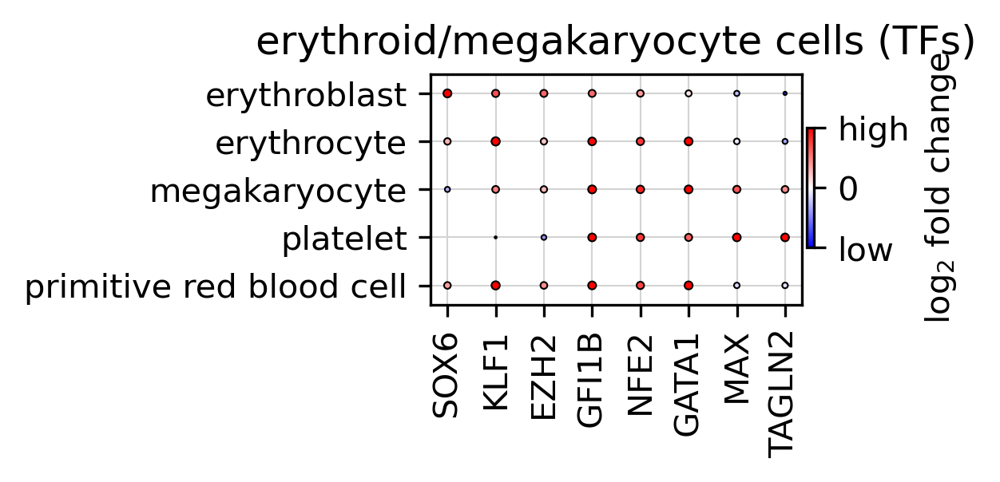

endothelial cells
	17 cell types
	38 genes
	n_cell_types * n_genes = 646 (np.sqrt(n_cell_types * n_genes )=25.41653005427767)


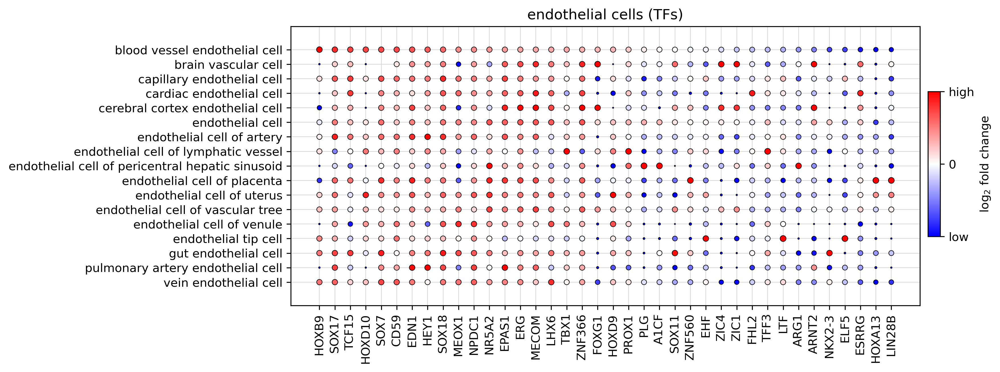

fibroblast/mesenchymal cells
	14 cell types
	33 genes
	n_cell_types * n_genes = 462 (np.sqrt(n_cell_types * n_genes )=21.494185260204677)


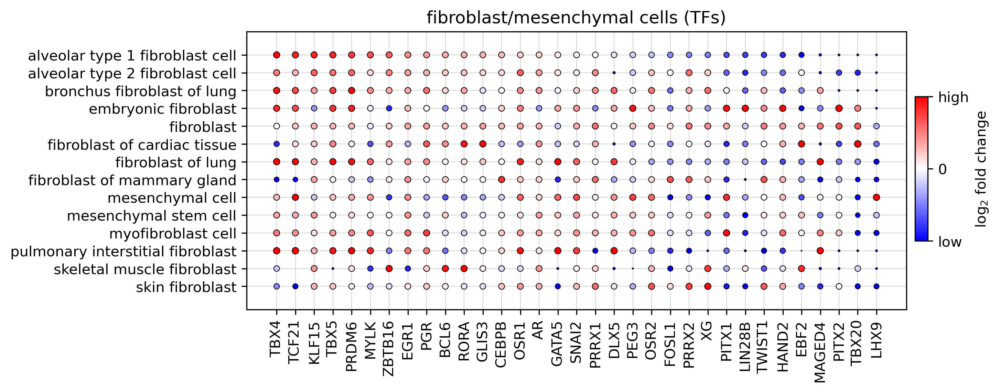

stromal/vascular support cells
	9 cell types
	23 genes
	n_cell_types * n_genes = 207 (np.sqrt(n_cell_types * n_genes )=14.38749456993816)


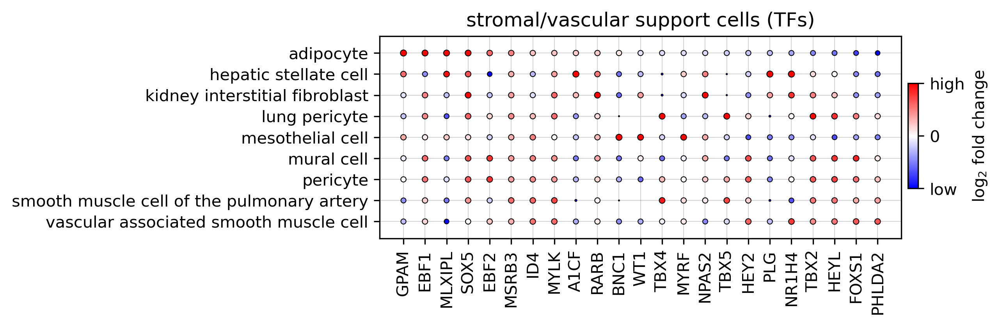

In [7]:
# params
top_n_genes = 3
pct_nz_group = 0.15
pvals_adj = 0.05
logfoldchanges = 1.0

for label, cell_list in cell_type_compartments.items():
    print(f"{label} cells")
    n_cell_types = len(cell_list)
    print(f"\t{n_cell_types} cell types")

    # extract the list of genes for the cell types
    gdf = df.copy()
    gdf = gdf[gdf['group'].isin(cell_list)]
    gdf = gdf[gdf['pct_nz_group'] > pct_nz_group].copy()
    gdf = gdf[gdf['pvals_adj'] < pvals_adj].copy()
    gdf = gdf[gdf['logfoldchanges'] > logfoldchanges].copy()

    # only TFs!
    gdf = gdf[gdf['names'].isin(tf_list)].copy()
    gdf = gdf.groupby('group').head(top_n_genes)

    deg_genes = gdf['names'].unique()
    n_genes = len(deg_genes)
    print(f"\t{n_genes} genes")

    # now filter the full frame for these genes
    pdf = df[df['names'].isin(deg_genes)].copy()
    pdf = pdf[pdf['group'].isin(cell_list)]

    # annotate TFs
    # pdf['names'] = pdf['names'].apply(lambda x: f"*{x}" if x in tf_list else x)
    
    pdf['label'] = pdf['group'].apply(lambda x: x.replace("_", " "))
    pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])
    
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = (n_genes * 0.25), (n_cell_types * 0.25)

    print(f"\t{n_cell_types * n_genes = } ({np.sqrt(n_cell_types * n_genes )=})")
    
    sns.scatterplot(
        data=pdf,
        x='names',
        y='label',
        hue='logfoldchanges',
        size='logfoldchanges',
        sizes=(0, np.sqrt(n_cell_types * n_genes )),
        ec='k',
        lw=0.5,
        palette='bwr',
        legend=False,
        zorder=3,
        hue_norm=(-5, 5),
    )

    plt.margins(y=0.1)
    plt.title(f"{label} cells (TFs)")
    plt.gca().tick_params(axis='x', rotation=90)
    plt.grid(True, zorder=0, c='lightgrey', lw=0.5)
    plt.ylabel("")
    plt.xlabel("")
    
    ax = plt.gca()
    y_labels = ax.get_yticklabels()
    y_ticks = ax.get_yticks()

    # Add standalone colorbar to the right
    fig = plt.gcf()
    cmap = plt.get_cmap('bwr')
    norm = mpl.colors.Normalize(vmin=-5, vmax=5)
    
    # [left, bottom, width, height] — adjust as needed
    cbar_ax = fig.add_axes([0.91, 0.3, 0.015, 0.4])
    
    cb = mpl.colorbar.ColorbarBase(
        cbar_ax,
        cmap=cmap,
        norm=norm,
        orientation='vertical'
    )
    
    cb.set_label('log$_2$ fold change', fontsize=10)
    cb.set_ticks([-5, 0, 5])
    cb.set_ticklabels(['low', '0', 'high'])
    
    plt.show()

In [8]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
# break

# Marker Genes

In [ ]:
def load_pathway(fpath):
    """
    Loads an Enrichr-like database file into a boolean DataFrame.

    Args:
        fpath (str): Path to the Enrichr-like database file.

    Returns:
        pandas.DataFrame: A boolean DataFrame where:
            - Index: Genes
            - Columns: Pathways
            - Values: True if the gene is in the pathway, False otherwise.
    """

    result = []
    with open(fpath,  encoding='utf-8') as f:
        for line in f:
            split_line = [x for x in line.strip().split('\t') if x]  # Remove empty strings directly

            row = {'label': split_line[0]}
            for gene in split_line[1:]:
                row[gene] = 1

            result.append(row)

    df = pd.DataFrame(result)
    df = df.fillna(0.0).set_index('label').astype(bool).T  # Chained operations for clarity
    return df

fpath = "../../resources/Tabula_Sapiens.txt"
tab = load_pathway(fpath)
print(f"{tab.shape=}")
tab.head()

In [ ]:
canonical_to_finegrained = {
    'endothelial_cells': [
        'Bladder-capillary Endothelial Cell',
        'Lung-capillary Endothelial Cell',
        'Muscle-endothelial Cell Of Vascular Tree',
        'Kidney-endothelial Cell',
        'Vasculature-endothelial Cell',
        'Spleen-endothelial Cell',
        'Liver-endothelial Cell'
    ],

    'fibroblasts': [
        'Bladder-fibroblast',
        'Large Intestine-fibroblast',
        'Liver-fibroblast',
        'Heart-fibroblast Of Cardiac Tissue',
        'Pancreas-fibroblast',
        'Fat-fibroblast',
        'Salivary Gland-fibroblast',
        'Trachea-fibroblast'
    ],

    'hematopoietic_progenitors': [
        'Bone Marrow-myeloid Progenitor',
        'Blood-myeloid Progenitor',
        'Prostate-erythroid Progenitor'
    ],

    'hsc': [
        'Blood-hematopoietic Stem Cell',
        'Bone Marrow-hematopoietic Stem Cell',
        'Spleen-hematopoietic Stem Cell',
        'Lymph Node-hematopoietic Stem Cell'
    ],

    'innate_lymphoid_cells': [
        'Lymph Node-innate Lymphoid Cell',
        'Spleen-innate Lymphoid Cell',
        'Thymus-innate Lymphoid Cell'
    ],

    'lymphoid_cells': [
        'Blood-cd4-positive, Alpha-Beta T Cell',
        'Blood-cd8-positive, Alpha-Beta T Cell',
        'Lymph Node-cd4-positive Alpha-Beta T Cell',
        'Lymph Node-cd8-positive Alpha-Beta T Cell',
        'Spleen-cd4-positive, Alpha-Beta Memory T Cell',
        'Spleen-cd8-positive, Alpha-Beta T Cell'
    ],

    'mesenchymal_cells': [
        'Muscle-mesenchymal Stem Cell',
        'Fat-mesenchymal Stem Cell'
    ],

    'myeloid_cells': [
        'Blood-monocyte',
        'Lung-macrophage',
        'Spleen-macrophage',
        'Liver-macrophage',
        'Bone Marrow-monocyte',
        'Blood-neutrophil',
        'Blood-classical Monocyte',
        'Lung-dendritic Cell'
    ]
}

In [ ]:
break